## Capstone Project_Customer Segmentation Model - Nexus Bank 07.06.2023

Problem Definition
To identify patterns and trends in customer behaviour to understand how effective the bank’s campaigns are and thus develop marketing campaigns to reach specific customer segments. By analyzing customer behaviors, loan trends, and marketing campaign effectiveness, and optimize its operations, mitigate risks/ loan defaults, and improve customer subscription to term deposits.


In [4]:
#Import required libraries
#Data Analysis libraries
import pandas as pd
import numpy as np

#Data visualization
import seaborn as sns
import matplotlib.pyplot as plt
plt.style.use('ggplot')
from collections import Counter

#machine learning and evaluation
from sklearn.cluster import KMeans
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.metrics import silhouette_score, homogeneity_score

import warnings
warnings.filterwarnings("ignore")

In [5]:
#load dataset
data = pd.read_csv(r"C:\Users\MUTHENGI\Downloads\bank.csv")
data.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,deposit
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no


## Data Inspection

In [39]:
data.shape

(45211, 17)

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        45211 non-null  int64 
 1   job        45211 non-null  object
 2   marital    45211 non-null  object
 3   education  45211 non-null  object
 4   default    45211 non-null  object
 5   balance    45211 non-null  int64 
 6   housing    45211 non-null  object
 7   loan       45211 non-null  object
 8   contact    45211 non-null  object
 9   day        45211 non-null  int64 
 10  month      45211 non-null  object
 11  duration   45211 non-null  int64 
 12  campaign   45211 non-null  int64 
 13  pdays      45211 non-null  int64 
 14  previous   45211 non-null  int64 
 15  poutcome   45211 non-null  object
 16  deposit    45211 non-null  object
dtypes: int64(7), object(10)
memory usage: 5.9+ MB


In [43]:
data.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
age,45211.0,NaN,NaN,NaN,40.93621,10.618762,18.0,33.0,39.0,48.0,95.0
job,45211,12,blue-collar,9732,NaN,NaN,NaN,NaN,NaN,NaN,NaN
marital,45211,3,married,27214,NaN,NaN,NaN,NaN,NaN,NaN,NaN
education,45211,4,secondary,23202,NaN,NaN,NaN,NaN,NaN,NaN,NaN
default,45211,2,no,44396,NaN,NaN,NaN,NaN,NaN,NaN,NaN
balance,45211.0,NaN,NaN,NaN,1362.272058,3044.765829,-8019.0,72.0,448.0,1428.0,102127.0
housing,45211,2,yes,25130,NaN,NaN,NaN,NaN,NaN,NaN,NaN
loan,45211,2,no,37967,NaN,NaN,NaN,NaN,NaN,NaN,NaN
contact,45211,3,cellular,29285,NaN,NaN,NaN,NaN,NaN,NaN,NaN
day,45211.0,NaN,NaN,NaN,15.806419,8.322476,1.0,8.0,16.0,21.0,31.0


In [8]:
#check for missing values
print (data.isnull().sum())

age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
deposit      0
dtype: int64


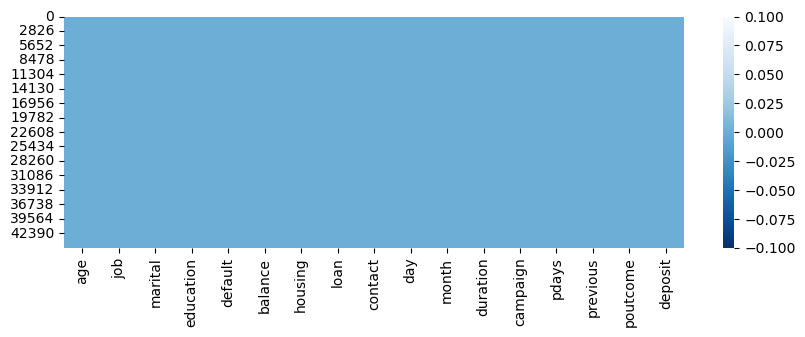

In [10]:
#visualizing the missing data
plt.figure(figsize=(10,3))
sns.heatmap(data.isnull(), cbar=True, cmap="Blues_r");

## Data Cleaning and Pre-processing

In [11]:
#Check for duplicates
print(data.duplicated().sum())

0


In [41]:
data.columns

Index(['age', 'job', 'marital', 'education', 'default', 'balance', 'housing',
       'loan', 'contact', 'day', 'month', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'deposit'],
      dtype='object')

In [42]:
# print unique values in each column
for i in data.columns.tolist():
    print(i, '\n\n', data[i].unique())
    print('\n.......................................................................................')

age 

 [58 44 33 47 35 28 42 43 41 29 53 57 51 45 60 56 32 25 40 39 52 46 36 49
 59 37 50 54 55 48 24 38 31 30 27 34 23 26 61 22 21 20 66 62 83 75 67 70
 65 68 64 69 72 71 19 76 85 63 90 82 73 74 78 80 94 79 77 86 95 81 18 89
 84 87 92 93 88]

.......................................................................................
job 

 ['management' 'technician' 'entrepreneur' 'blue-collar' 'unknown'
 'retired' 'admin.' 'services' 'self-employed' 'unemployed' 'housemaid'
 'student']

.......................................................................................
marital 

 ['married' 'single' 'divorced']

.......................................................................................
education 

 ['tertiary' 'secondary' 'unknown' 'primary']

.......................................................................................
default 

 ['no' 'yes']

.......................................................................................
balance 

 [ 2143    29     2 

## Exploratory Data Analysis

## Univariate Analysis

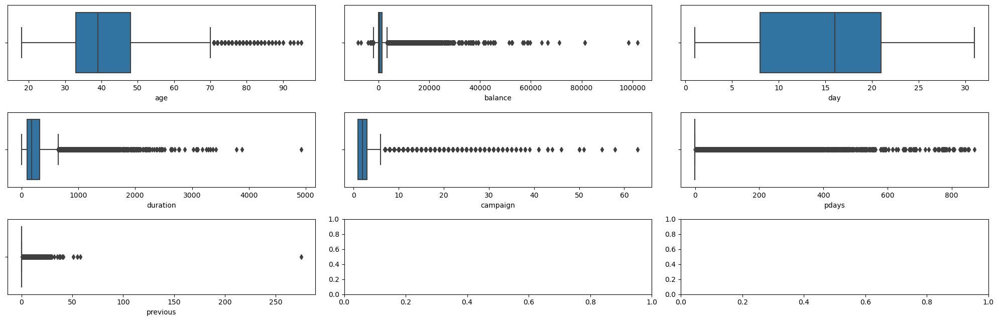

In [19]:
fig, axs = plt.subplots(3,3, figsize = (20,6.5))
plt1 = sns.boxplot(data['age'], ax= axs[0,0])
plt2 = sns.boxplot(data['balance'], ax= axs[0,1])
plt3 = sns.boxplot(data['day'], ax= axs[0,2])
plt4 = sns.boxplot(data['duration'], ax= axs[1,0])
plt5 = sns.boxplot(data['campaign'], ax= axs[1,1])
plt6 = sns.boxplot(data['pdays'], ax= axs[1,2])
plt7 = sns.boxplot(data['previous'], ax= axs[2,0])

plt.tight_layout()

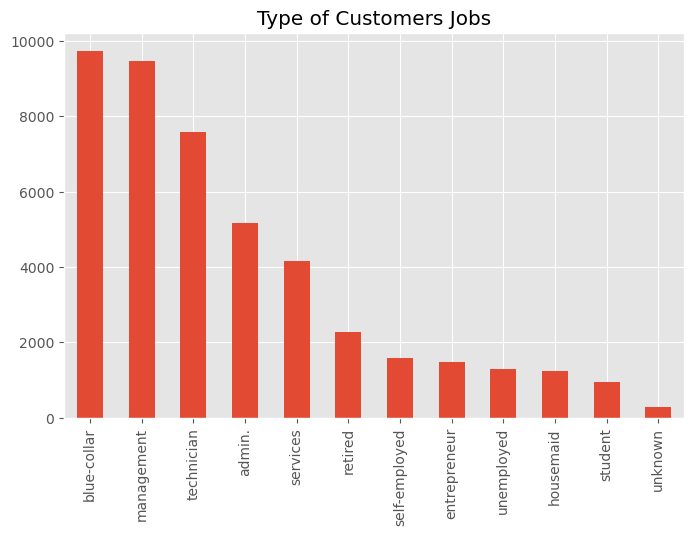

In [98]:
plt.figure(figsize=(8,5))
data["job"].value_counts().plot(kind="bar")
plt.title('Type of Customers Jobs');

From this observation most customers are in the blue collar jobs while the least number of customers are in an unknown jobs followed by students.

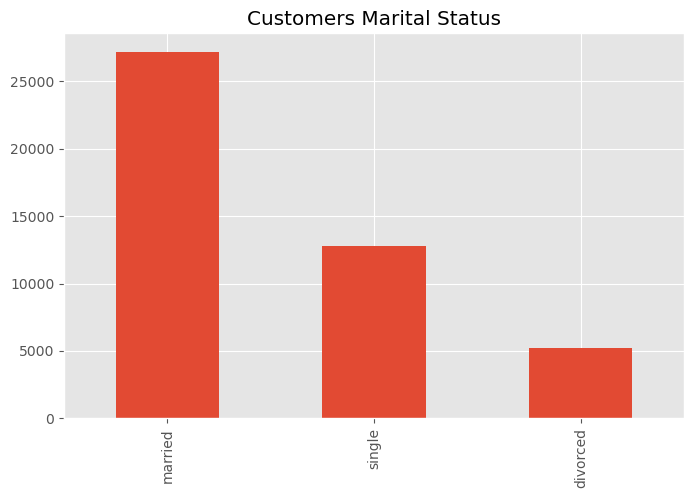

In [97]:
plt.figure(figsize=(8,5))
data["marital"].value_counts().plot(kind="bar")
plt.title('Customers Marital Status');

from the observation most customers are married

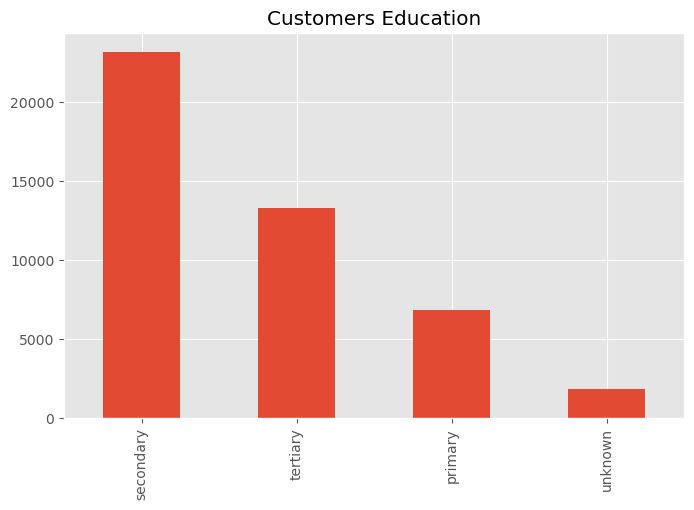

In [96]:
plt.figure(figsize=(8,5))
data["education"].value_counts().plot(kind="bar")
plt.title('Customers Education');

from the observation most customers level of education is tertiary

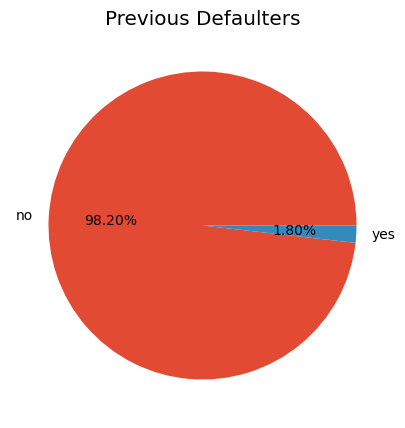

In [51]:

fig,ax=plt.subplots(figsize=(5,5))
count = Counter(data["default"])
ax.pie(count.values(), labels=count.keys(), autopct=lambda p:f'{p:.2f}%')
plt.title('Previous Defaulters')
plt.show();

from the observation 98% customers have never defaulted on loans or credit payment, this would mean that customers repay their loans and credit payments.

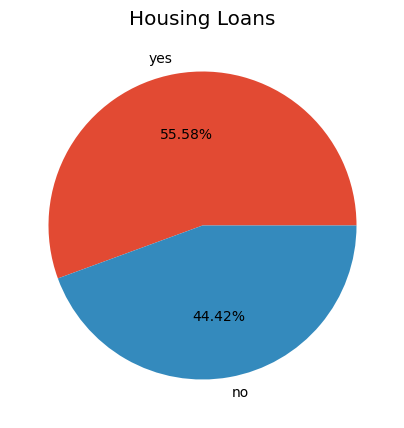

In [52]:

fig,ax=plt.subplots(figsize=(5,5))
count = Counter(data["housing"])
ax.pie(count.values(), labels=count.keys(), autopct=lambda p:f'{p:.2f}%')
plt.title('Housing Loans')
plt.show();

from the observation 55% customers have housing loans

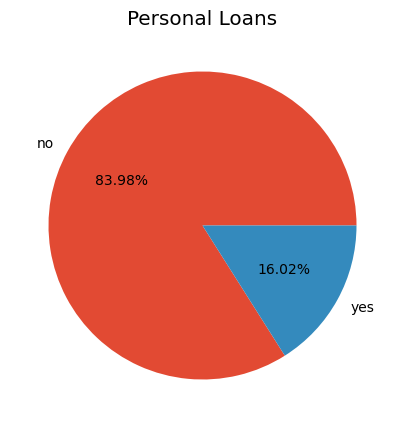

In [53]:

fig,ax=plt.subplots(figsize=(5,5))
count = Counter(data["loan"])
ax.pie(count.values(), labels=count.keys(), autopct=lambda p:f'{p:.2f}%')
plt.title('Personal Loans')
plt.show();

from the observation only 16% customers have personal loans. The bank can offer low interest loans or secured loans to customers.

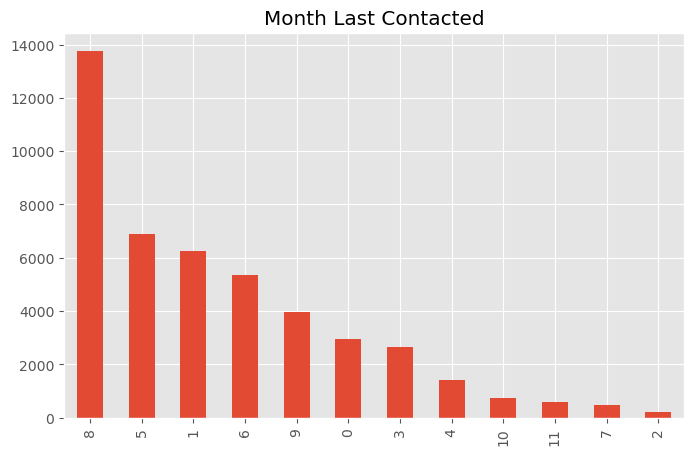

In [11]:
plt.figure(figsize=(8,5))
data["month"].value_counts().plot(kind="bar");
plt.title('Month Last Contacted')
plt.show();

from the observation may has the highest number when customers were last contacted, while December has the least. Could be because December is festive season.

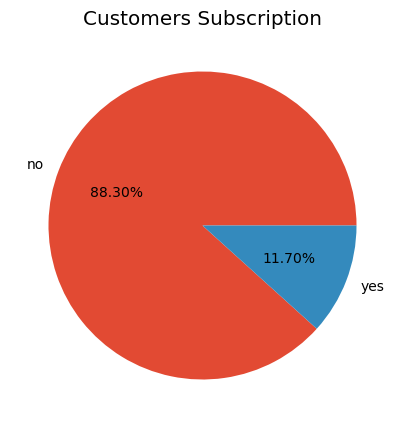

In [56]:
fig,ax=plt.subplots(figsize=(5,5))
count = Counter(data["deposit"])
ax.pie(count.values(), labels=count.keys(), autopct=lambda p:f'{p:.2f}%')
plt.title('Customers Subscription')
plt.show();

from the observation 88% customers have not subscribed to deposits while only 11% have done so. Focus should be more on how we can encourage those who have not subscribed to subscribe. create an awareness of the subscription to the customers.

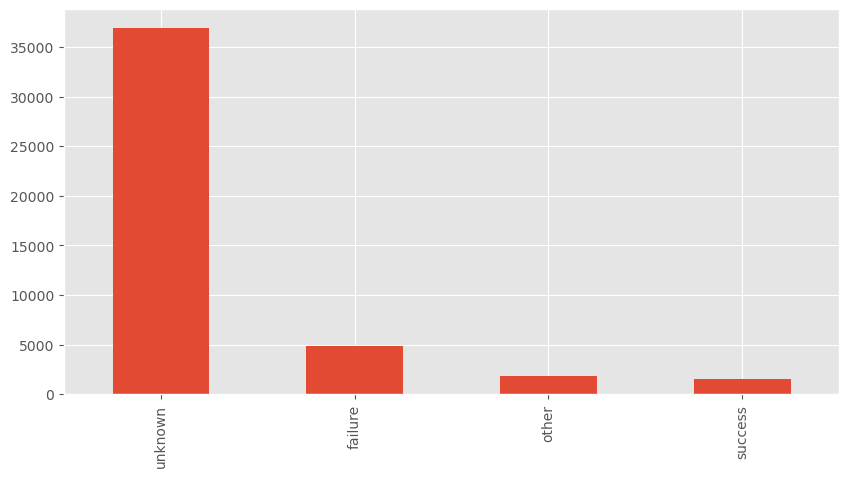

In [94]:
plt.figure(figsize=(10,5))
data["poutcome"].value_counts().plot(kind="bar");

from the above observation unknown has the highest outcome of the previous marketing campaign. 

## Bivariate Analysis

In [8]:
plt.figure(figsize=(10,5))
sns.boxplot(x='deposit', y='age', data=data)
plt.title('Subscriptons by Age Distribution');

In [9]:
plt.figure(figsize=(10,5))
sns.boxplot(x='default', y='age', data=data)
plt.title('Defaulters by Age Distribution');

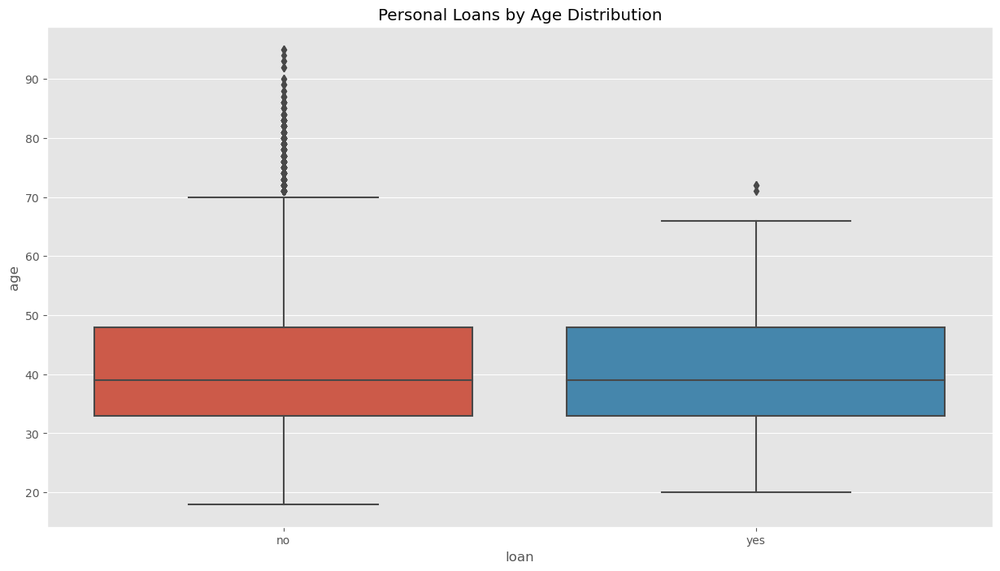

In [120]:
plt.figure(figsize=(15,8))
sns.boxplot(x='loan', y='age', data=data)
plt.title('Personal Loans by Age Distribution');

from this observation, those with personal loans are from ages 35-48.

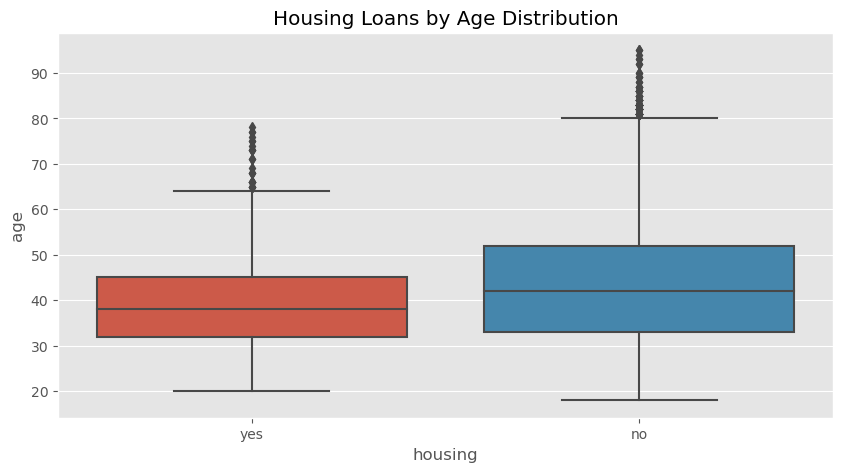

In [119]:
plt.figure(figsize=(10,5))
sns.boxplot(x='housing', y='age', data=data)
plt.title('Housing Loans by Age Distribution');

from this observation those with housing loans are between ages 32 to 45.

1    9732
4    9458
9    7597
0    5171
7    4154
Name: job, dtype: int64


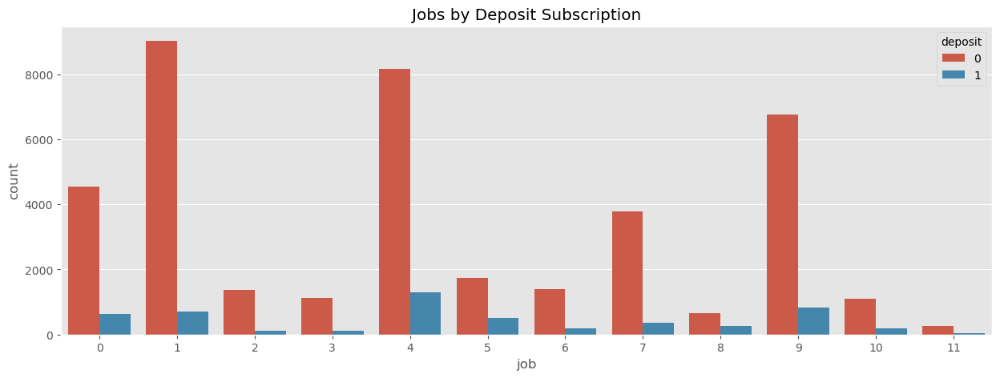

In [12]:
plt.figure(figsize=(15,5))
topfive= data['job'].value_counts().head(5)
plt.xlabel('Deposit')
plt.ylabel('Count')
sns.countplot(x='job', data=data, hue='deposit')
plt.title('Jobs by Deposit Subscription');
print(topfive)


from this observation those in management (4) have a higher subscription than other jobs.

Text(0.5, 1.0, 'Housing Vs Deposits')

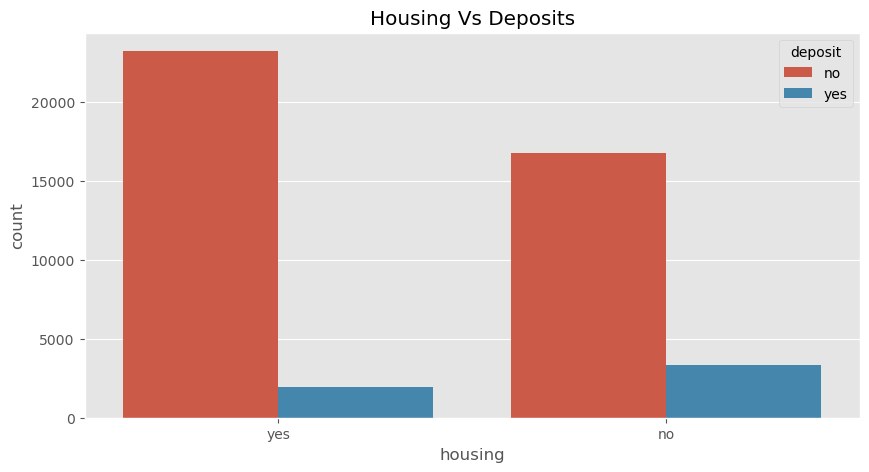

In [91]:
plt.figure(figsize=(10,5))
plt.xlabel('Deposit')
plt.ylabel('Count')
sns.countplot(x='housing', data=data, hue='deposit');
plt.title('Housing Vs Deposits')


from this observation customers without housing loans have a significant higher customers subscribed to deposit.

Text(0.5, 1.0, 'Loan Vs Deposits')

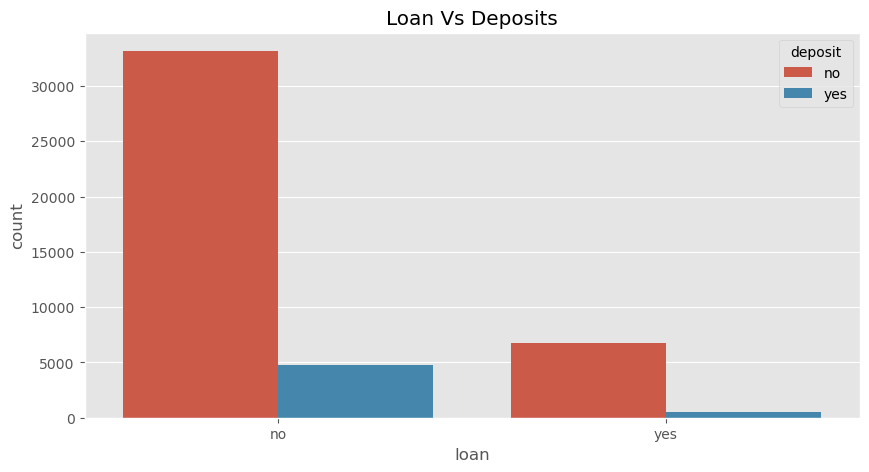

In [90]:
plt.figure(figsize=(10,5))
plt.xlabel('Deposit')
plt.ylabel('Count')
sns.countplot(x='loan', data=data, hue='deposit');
plt.title('Loan Vs Deposits')

from this observation customers without personal loans have a significant higher customers subscribed to deposit.

Text(0.5, 1.0, 'Defaulters Vs Deposits')

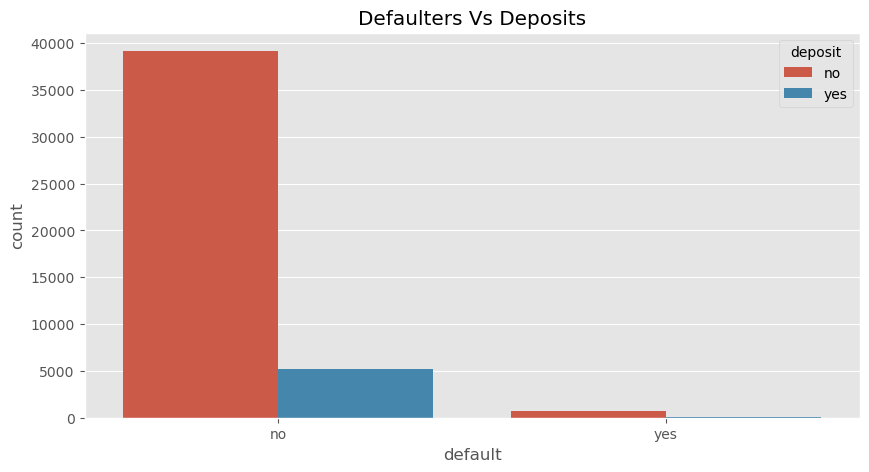

In [89]:
plt.figure(figsize=(10,5))
plt.xlabel('Deposit')
plt.ylabel('Count')
sns.countplot(x='default', data=data, hue='deposit');
plt.title('Defaulters Vs Deposits')

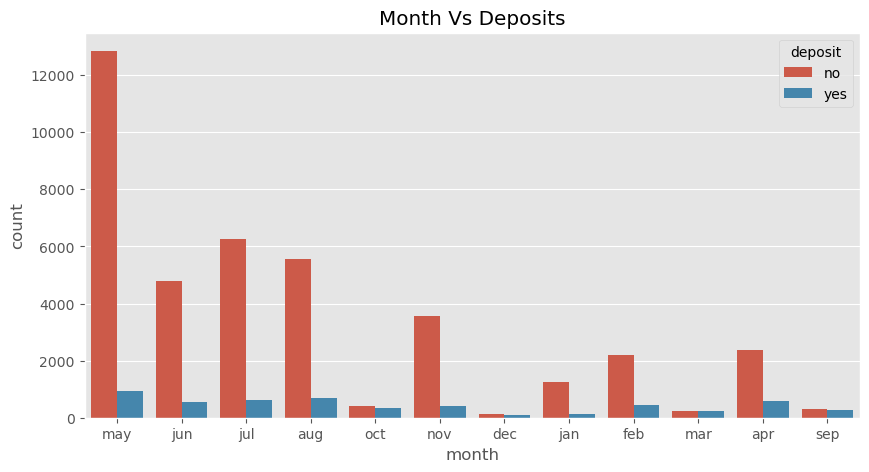

In [88]:
plt.figure(figsize=(10,5))
plt.xlabel('Deposit')
plt.ylabel('Count')
sns.countplot(x='month', data=data, hue='deposit')
plt.title('Month Vs Deposits');

from this observation, desite May being the highest number of calls made the subscription is not as significant as the other months.

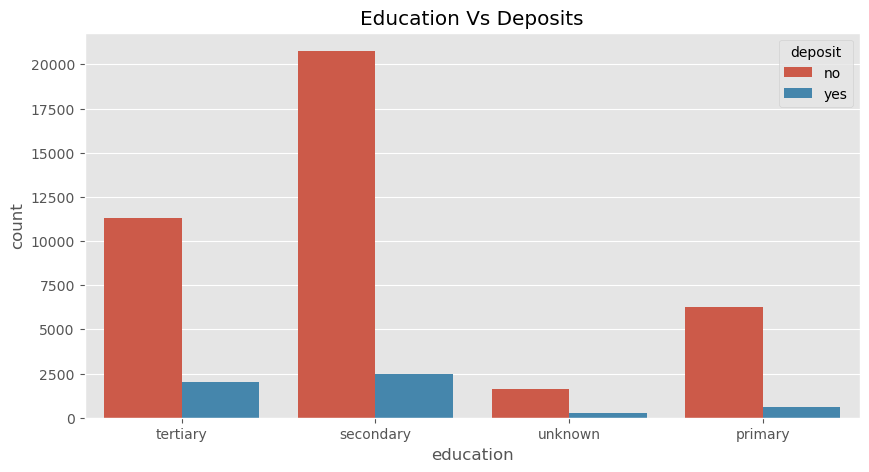

In [87]:
plt.figure(figsize=(10,5))
plt.xlabel('Deposit')
plt.ylabel('Count')
sns.countplot(x='education', data=data, hue='deposit')
plt.title('Education Vs Deposits');

from this observation, those with secodnary level of education have slightly higher subscriptions to deposits compared to other levels of education.

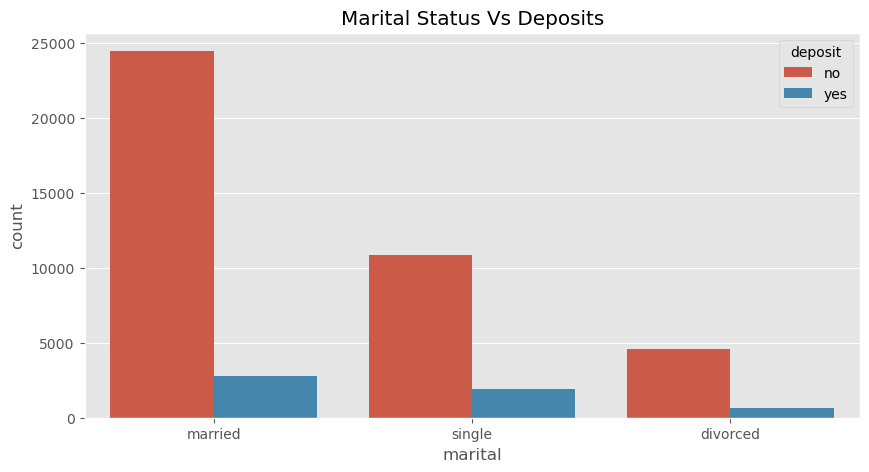

In [99]:
plt.figure(figsize=(10,5))
plt.xlabel('Deposit')
plt.ylabel('Count')
sns.countplot(x='marital', data=data, hue='deposit')
plt.title('Marital Status Vs Deposits');

from this observation most cutomers are married and the married have a significant amount of cutomers subscribed to deposit.

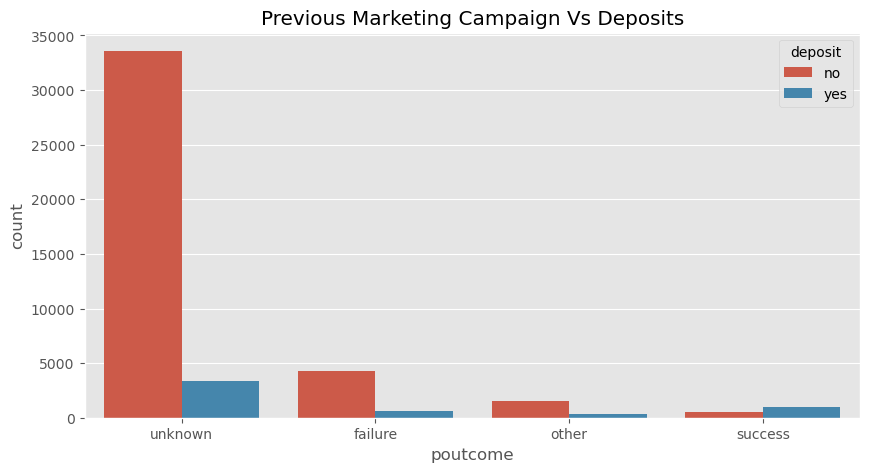

In [85]:
plt.figure(figsize=(10,5))
plt.xlabel('Deposit')
plt.ylabel('Count')
sns.countplot(x='poutcome', data=data, hue='deposit')
plt.title('Previous Marketing Campaign Vs Deposits');

From the previous campaigns there was no significant subscription to deposit, the bank should look for other ways to create awareness to customers.

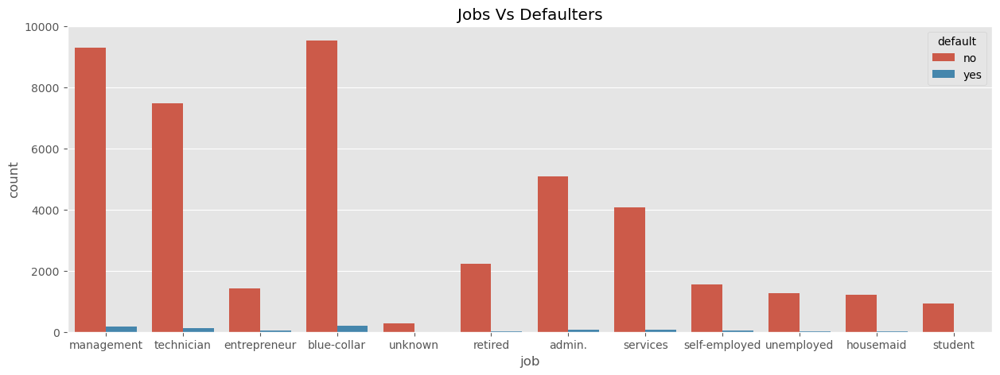

In [101]:
plt.figure(figsize=(15,5))
plt.xlabel('Default')
plt.ylabel('Count')
sns.countplot(x='job', data=data, hue='default')
plt.title('Jobs Vs Defaulters');

From this observation, more customers work in blue-collar management, followed by technician and management and only a significant of the customers in those jobs have ever defaulted n a loan or credit card payment.


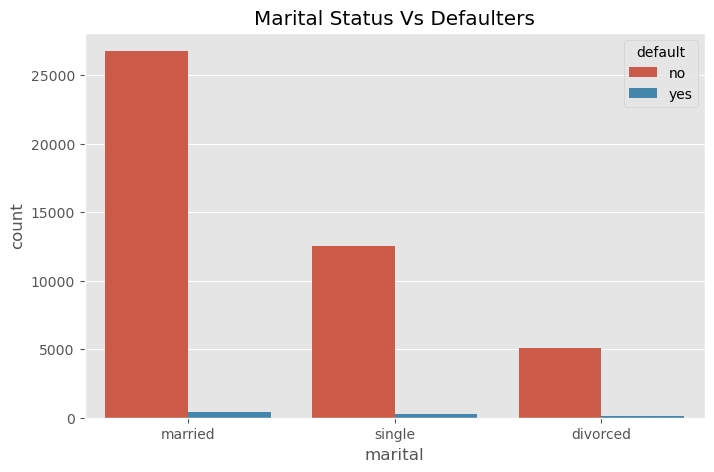

In [103]:
plt.figure(figsize=(8,5))
plt.xlabel('Default')
plt.ylabel('Count')
sns.countplot(x='marital', data=data, hue='default')
plt.title('Marital Status Vs Defaulters');

from this observation most cutomers are married and the married have a significant amount of cutomers defaulted to loans and credit card payment

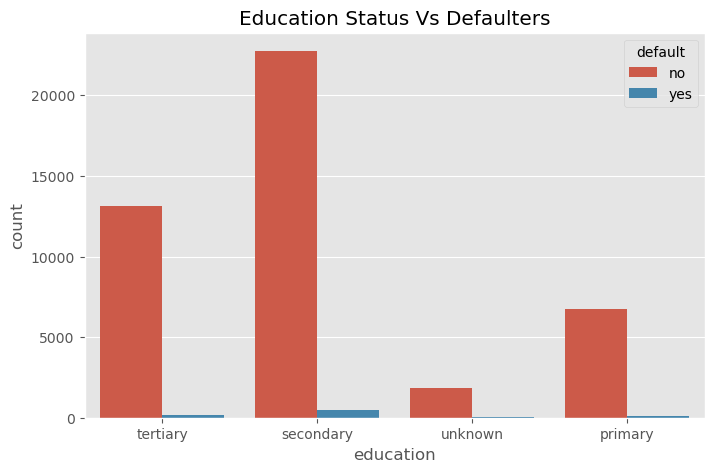

In [104]:
plt.figure(figsize=(8,5))
plt.xlabel('Default')
plt.ylabel('Count')
sns.countplot(x='education', data=data, hue='default')
plt.title('Education Status Vs Defaulters');

from this observation very few customers with secondary level of education have ever defaulted as compared to other levels, its not much but it can be detimental to the bank due to losses incurred.

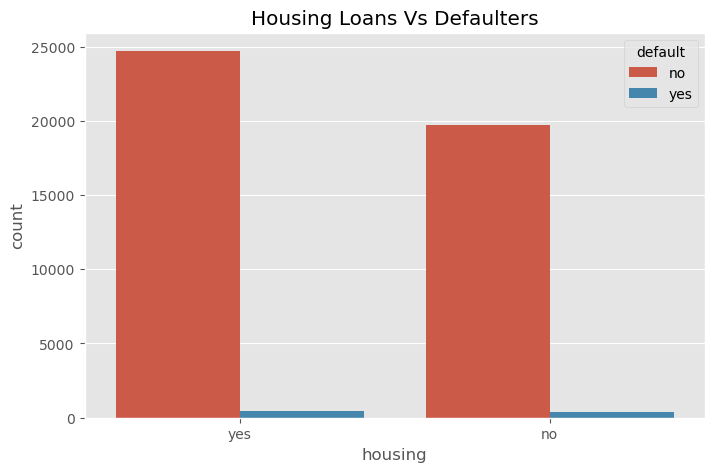

In [105]:
plt.figure(figsize=(8,5))
plt.xlabel('Default')
plt.ylabel('Count')
sns.countplot(x='housing', data=data, hue='default')
plt.title('Housing Loans Vs Defaulters');

from this observation very few customers with housing loans have ever defaulted its not much but it can be detimental to the bank due to losses incurred.

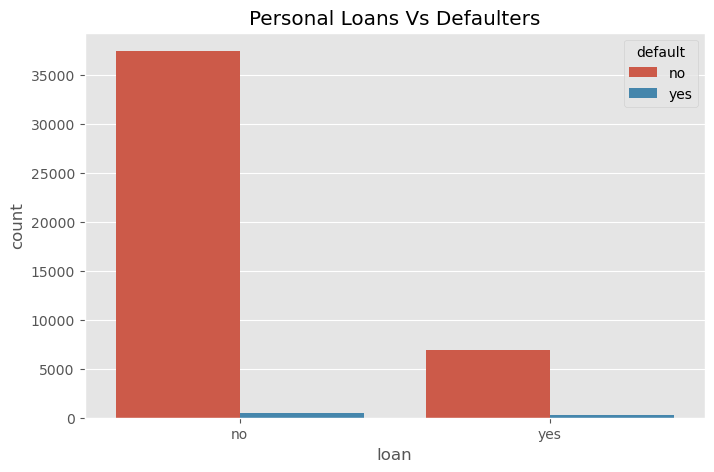

In [106]:
plt.figure(figsize=(8,5))
plt.xlabel('Default')
plt.ylabel('Count')
sns.countplot(x='loan', data=data, hue='default')
plt.title('Personal Loans Vs Defaulters');

from this observation very few customers with personal loans have ever defaulted its not much but it can be detimental to the bank due to losses incurred.

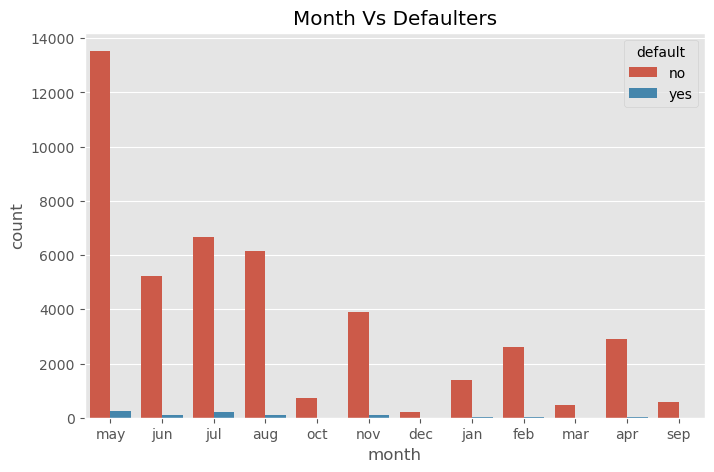

In [107]:
plt.figure(figsize=(8,5))
plt.xlabel('Default')
plt.ylabel('Count')
sns.countplot(x='month', data=data, hue='default')
plt.title('Month Vs Defaulters');

from this observation very few customers defaulted in the month of may, june and july its not much but it can be detimental to the bank due to losses incurred.

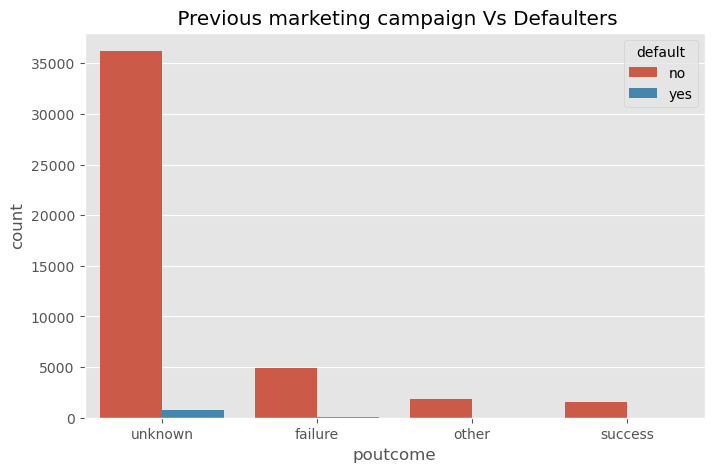

In [108]:
plt.figure(figsize=(8,5))
plt.xlabel('Default')
plt.ylabel('Count')
sns.countplot(x='poutcome', data=data, hue='default')
plt.title(' Previous marketing campaign Vs Defaulters');

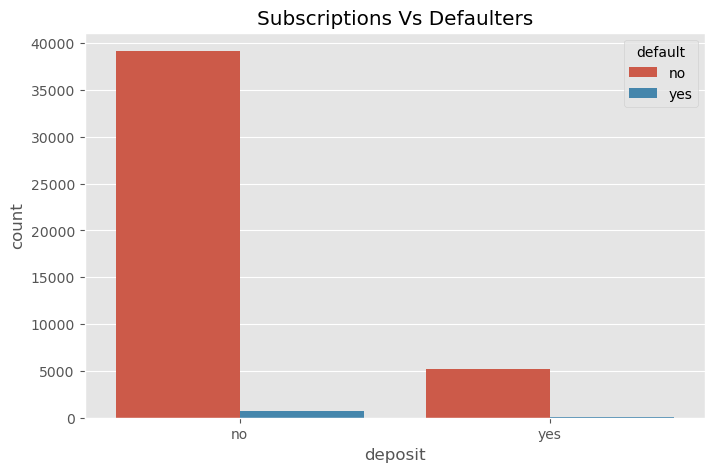

In [109]:
plt.figure(figsize=(8,5))
plt.xlabel('Default')
plt.ylabel('Count')
sns.countplot(x='deposit', data=data, hue='default')
plt.title('Subscriptions Vs Defaulters');

from this observation very few have subscribed to deposit compared to those who have not and the defaulters are very low.

<Figure size 800x500 with 0 Axes>

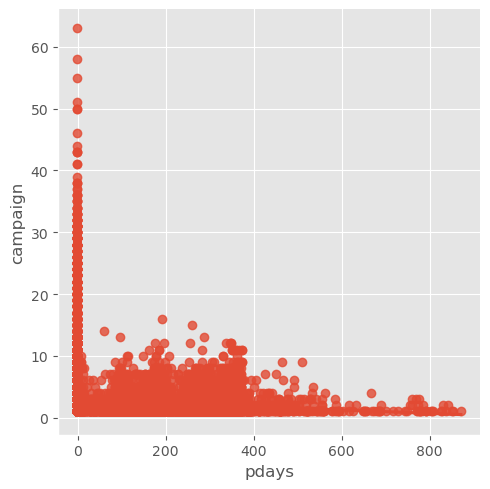

In [14]:
plt.figure(figsize=(8,5))
sns.lmplot(x='pdays', y='campaign', data=data);

from this observation

## Correlation of Data

In [15]:
from pandas_profiling import ProfileReport

In [32]:
data_profile = ProfileReport(data)
data_profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Multivariate Analysis

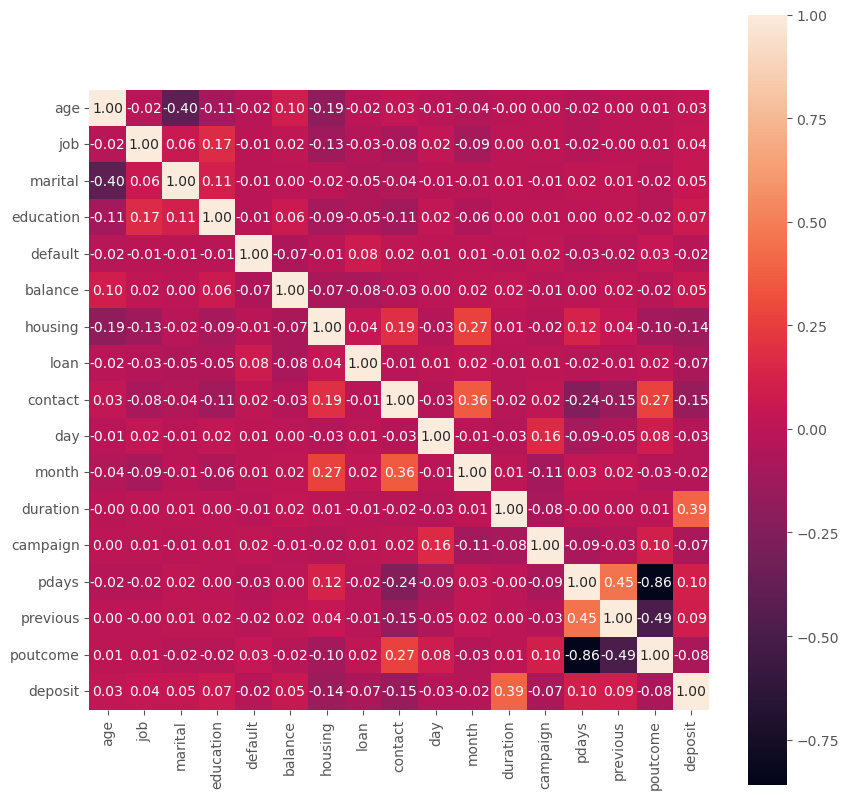

In [8]:

plt.figure(figsize=(20,10))
sns.heatmap(data.corr(),annot=True);

In [22]:
from pandas_profiling import ProfileReport

In [10]:
data_profile =ProfileReport(data)
data_profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Data Pre-processing

In [45]:
from sklearn.preprocessing import LabelEncoder

#Label Encoding, convert categorical to numerical data
encoder = LabelEncoder() 
for c in data.columns[1:]:
    if(data[c].dtype=='object'):
        data[c] = encoder.fit_transform(data[c])
    else:
            data[c] = data[c]
            
data.head(-10)

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,deposit,Cluster
0,58,4,1,2,0,2143,1,0,2,5,8,261,1,-1,0,3,0,0
1,44,9,2,1,0,29,1,0,2,5,8,151,1,-1,0,3,0,1
2,33,2,1,1,0,2,1,1,2,5,8,76,1,-1,0,3,0,1
3,47,1,1,3,0,1506,1,0,2,5,8,92,1,-1,0,3,0,1
4,33,11,2,3,0,1,0,0,2,5,8,198,1,-1,0,3,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45196,25,8,2,1,0,358,0,0,0,16,9,330,1,-1,0,3,1,1
45197,36,4,2,1,0,1511,1,0,0,16,9,270,1,-1,0,3,1,1
45198,37,4,1,2,0,1428,0,0,0,16,9,333,2,-1,0,3,0,1
45199,34,1,2,1,0,1475,1,0,0,16,9,1166,3,530,12,1,0,1


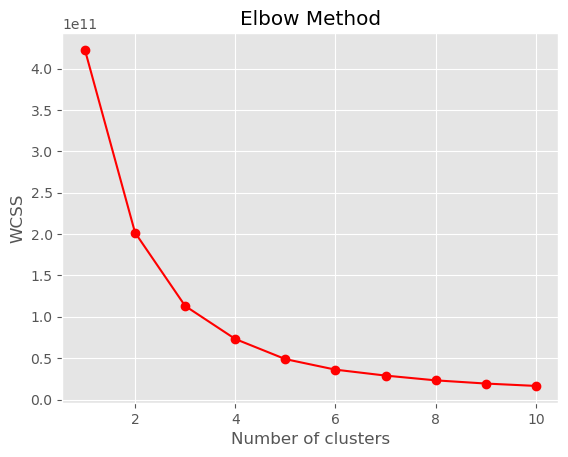

In [34]:
#Determine optimal number of clusters
wcss = []
for i in range (1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=42)
    kmeans.fit(data)
    wcss.append(kmeans.inertia_)
plt.plot(range(1,11), wcss, color='red', marker='o')
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [35]:
kmeans = KMeans(n_clusters=5, init='k-means++', random_state=42)
kmeans.fit(data)

data['Cluster'] = kmeans.labels_


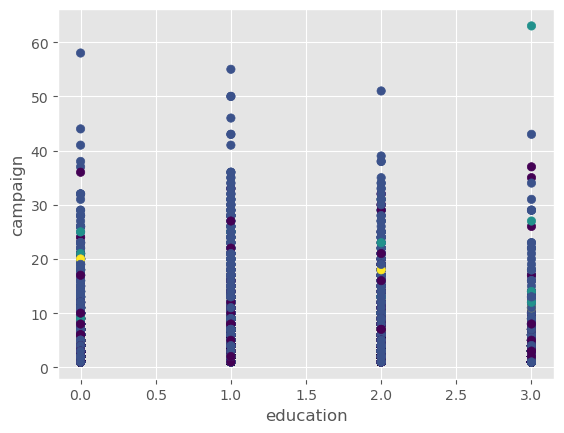

0.6869954024051609

In [158]:
#Visualize cluster results

plt.scatter(data['education'], data['campaign'], c=data['Cluster'], label='Centroids')
plt.xlabel('education')
plt.ylabel('campaign')
plt.show()

#calculate silhouette score

from sklearn.metrics import silhouette_score
silhouette_score(data, kmeans.labels_)

In conclusion

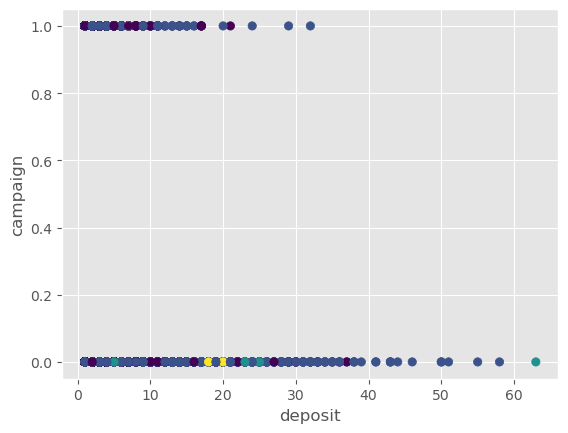

0.6869954024051609

In [38]:
plt.scatter(data['campaign'], data['deposit'], c=data['Cluster'], label='Centroids')
plt.xlabel('deposit')
plt.ylabel('campaign')
plt.show()

#calculate silhouette score

from sklearn.metrics import silhouette_score
silhouette_score(data, kmeans.labels_)

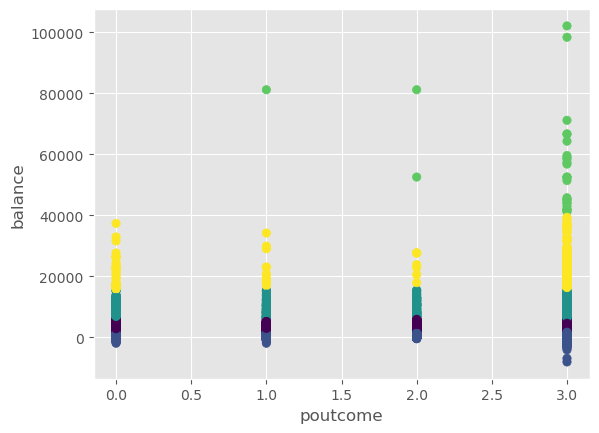

0.6869954024051609

In [165]:

plt.scatter(data['poutcome'], data['balance'], c=data['Cluster'], label='Centroids')
plt.xlabel('poutcome')
plt.ylabel('balance')
plt.show()

#calculate silhouette score

from sklearn.metrics import silhouette_score
silhouette_score(data, kmeans.labels_)

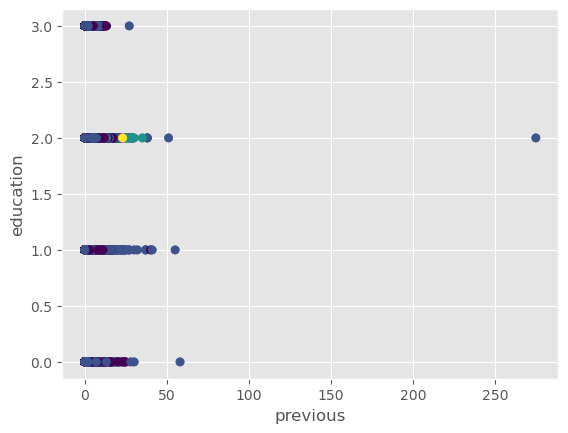

0.6869954024051609

In [170]:
plt.scatter(data['previous'], data['education'], c=data['Cluster'], label='Centroids')
plt.xlabel('previous')
plt.ylabel('education')
plt.show()

#calculate silhouette score

from sklearn.metrics import silhouette_score
silhouette_score(data, kmeans.labels_)

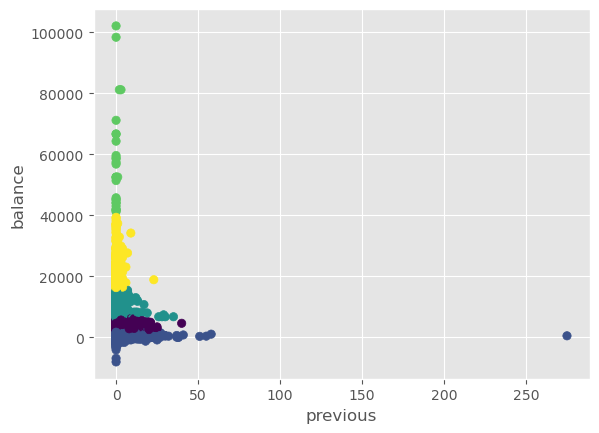

0.6869954024051609

In [171]:
plt.scatter(data['previous'], data['balance'], c=data['Cluster'], label='Centroids')
plt.xlabel('previous')
plt.ylabel('balance')
plt.show()

#calculate silhouette score

from sklearn.metrics import silhouette_score
silhouette_score(data, kmeans.labels_)

those with higher balance need to be contacted more, seems only those with lower balance were contacted.

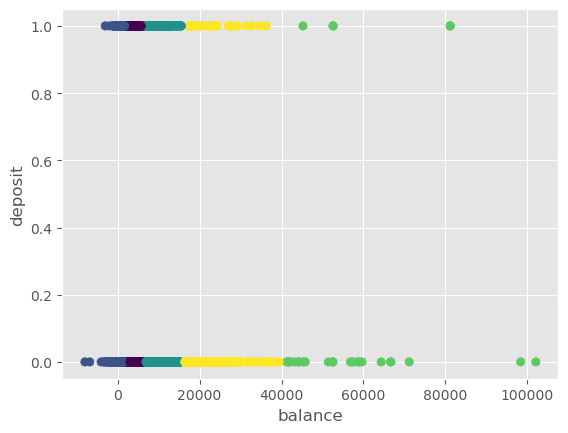

0.6869954024051609

In [179]:
plt.scatter(data['balance'], data['deposit'], c=data['Cluster'], label='Centroids')
plt.xlabel('balance')
plt.ylabel('deposit')
plt.show()

#calculate silhouette score

from sklearn.metrics import silhouette_score
silhouette_score(data, kmeans.labels_)

Bank needs to target those who have a higher balance to subscribe to 'deposits'

In [48]:
from sklearn.preprocessing import LabelEncoder

#Label Encoding, convert categorical to numerical data
encoder = LabelEncoder() 
for c in data.columns[1:]:
    if(data[c].dtype=='object'):
        data[c] = encoder.fit_transform(data[c])
    else:
            data[c] = data[c]
            
data.head(-10)

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,deposit,Cluster
0,58,4,1,2,0,2143,1,0,2,5,8,261,1,-1,0,3,0,0
1,44,9,2,1,0,29,1,0,2,5,8,151,1,-1,0,3,0,1
2,33,2,1,1,0,2,1,1,2,5,8,76,1,-1,0,3,0,1
3,47,1,1,3,0,1506,1,0,2,5,8,92,1,-1,0,3,0,1
4,33,11,2,3,0,1,0,0,2,5,8,198,1,-1,0,3,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45196,25,8,2,1,0,358,0,0,0,16,9,330,1,-1,0,3,1,1
45197,36,4,2,1,0,1511,1,0,0,16,9,270,1,-1,0,3,1,1
45198,37,4,1,2,0,1428,0,0,0,16,9,333,2,-1,0,3,0,1
45199,34,1,2,1,0,1475,1,0,0,16,9,1166,3,530,12,1,0,1


In [16]:
#create a dendrogram
import scipy.cluster.hierarchy as sch
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering 

In [17]:
plt.figure(figsize=(15, 7))
plt.title("Customer Segments Dendrogram")

dataset = pd.read_csv(r"C:\Users\MUTHENGI\Downloads\bank(1).csv")

X = dataset.iloc[:, [3, 4]].values
dendrogram = sch.dendrogram(sch.linkage(X, method='ward'))

ValueError: could not convert string to float: 'tertiary'

In [40]:
# Hierarchical clustering
hc = AgglomerativeClustering(n_clusters=4, affinity='euclidean',linkage = 'ward')

In [42]:
y_hc = hc.fit_predict(data)
y_hc

array([1, 2, 2, ..., 1, 2, 1], dtype=int64)

In [50]:
model = AgglomerativeClustering(n_clusters=5, affinity='euclidean', linkage='ward')
model.fit(X)
labels = model.labels_

ValueError: could not convert string to float: 'tertiary'